## 2025 PCO2 calibration correction analysis 
Sunburst Sensors recently informed OOI that they have corrected an error in their processing code that produces temperature-dependent data errors when deployment and calibration temperatures are significantly different. This notebook analyses the relative impact of this calibration change so that end-users can gauge impact 
on research products.

In [1]:
import xarray as xr 
import pandas as pd 
import numpy as np
import s3fs
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import matplotlib.dates as mdates
from datetime import datetime, timezone
from loguru import logger

In [2]:
after_bucket = "ooi-data/"
before_bucket = "ooi-data-vault/"
fs = s3fs.S3FileSystem(anon=True)

In [3]:
def load_data(stream_name, bucket):
    zarr_dir = bucket + stream_name
    zarr_store = fs.get_mapper(zarr_dir)
    ds = xr.open_zarr(zarr_store, consolidated=True)
    return ds[["pco2_seawater", "pco2w_thermistor_temperature"]]

In [4]:
stream_list = [ 
    "CE02SHBP-LJ01D-09-PCO2WB103-streamed-pco2w_b_sami_data_record",
    "CE04OSBP-LJ01C-09-PCO2WB104-streamed-pco2w_b_sami_data_record",
    "CE04OSPS-PC01B-4D-PCO2WA105-streamed-pco2w_a_sami_data_record",
    "CE04OSPS-SF01B-4F-PCO2WA102-streamed-pco2w_a_sami_data_record",
    "RS01SBPS-SF01A-4F-PCO2WA101-streamed-pco2w_a_sami_data_record",
    "RS03AXPS-SF03A-4F-PCO2WA301-streamed-pco2w_a_sami_data_record",
]

In [5]:
def ticks(plt):
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())           # tick every month
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y')) # e.g., "Jan 2024"
    plt.xticks(rotation=45)  # rotate for readability
    plt.tight_layout()
    # --- Add faint vertical lines at each month ---
    plt.grid(axis='x', linestyle='--', color='gray', alpha=0.5, linewidth=0.8)


In [6]:
def stream_summary(stream_name):
    print(f"loading {stream_name}")
    before = load_data(stream_name, before_bucket)
    after = load_data(stream_name, after_bucket)

    plt.figure(figsize=(40, 8))
    plt.ylim(0, 4000)
    plt.title("before and after correction")
    plt.scatter(before['pco2_seawater']['time'], before['pco2_seawater'], s=0.1, color='blue', label='before correction')
    plt.scatter(after['pco2_seawater']['time'], after['pco2_seawater'], s=0.1, color='orange', label='after correction')
    plt.legend(markerscale=50) 
    ticks(plt)
    plt.show()

    temperature = before['pco2w_thermistor_temperature']
    vmin, vmax = np.nanpercentile(temperature, [5, 95])
    plt.figure(figsize=(40, 8))
    plt.title("temperature reading")
    plt.ylim(0, 4000)
    plt.scatter(before['pco2_seawater']['time'], before['pco2_seawater'], s=0.1, c=temperature, cmap='coolwarm', norm=Normalize(vmin=vmin, vmax=vmax))
    ticks(plt)
    plt.show()


    common_times = np.intersect1d(before.time.values, after.time.values)

    before_sub = before.sel(time=common_times)
    after_sub = after.sel(time=common_times)

    years = before_sub['time.year']
    plt.ylim(0, 5000)
    plt.xlim(0, 5000)
    sc = plt.scatter(before_sub['pco2_seawater'], after_sub['pco2_seawater'], s=0.1, c=years, cmap='rainbow')
    plt.xlabel(f"{before_sub['pco2_seawater'].units} before correction")
    plt.ylabel(f"{after_sub['pco2_seawater'].units}after correction")
    cb = plt.colorbar(sc)
    cb.set_label('time')
    plt.show()

    temperature = before_sub['pco2w_thermistor_temperature']

    # compute 5th and 95th percentiles (ignoring nans)
    vmin, vmax = np.nanpercentile(temperature, [5, 95])
    
    plt.figure(figsize=(6, 6))
    sc = plt.scatter(
        before_sub['pco2_seawater'],
        after_sub['pco2_seawater'],
        s=0.1,
        c=temperature,
        cmap='coolwarm',
        norm=Normalize(vmin=vmin, vmax=vmax),
    )
    plt.xlim(0, 5000)
    plt.ylim(0, 5000)
    plt.xlabel(f"{before_sub['pco2_seawater'].units} before correction")
    plt.ylabel(f"{after_sub['pco2_seawater'].units} after correction")
    cb = plt.colorbar(sc)
    cb.set_label('Temperature (°C)')
    plt.show()

    return before_sub, after_sub

loading CE02SHBP-LJ01D-09-PCO2WB103-streamed-pco2w_b_sami_data_record


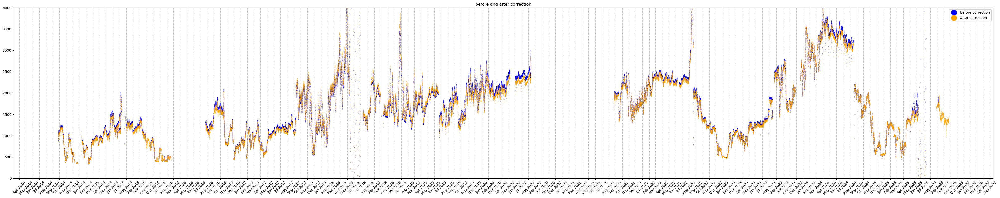

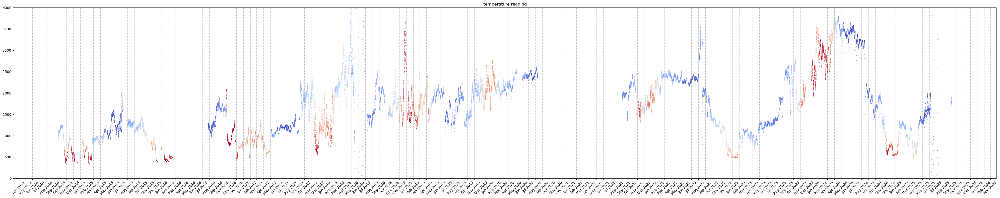

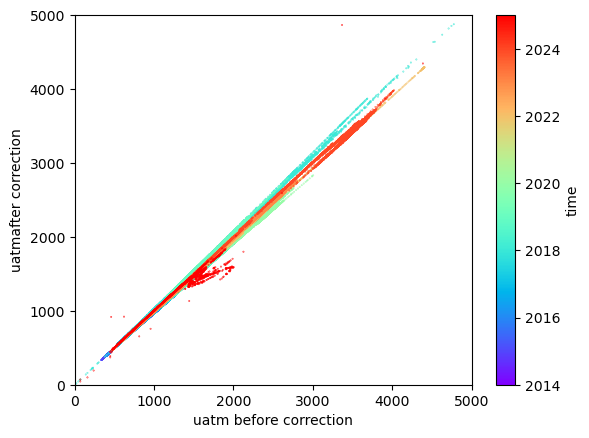

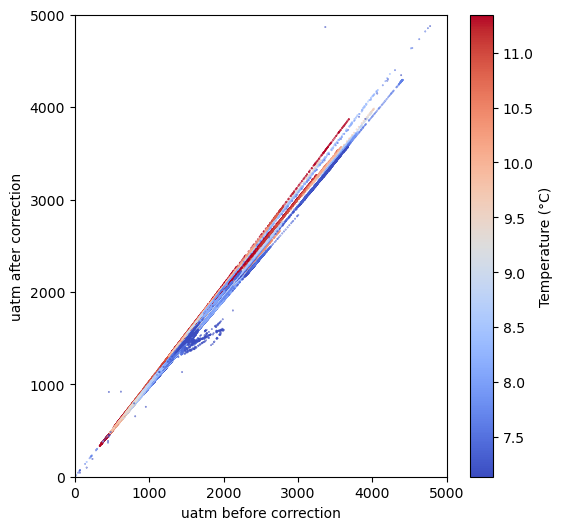

loading CE04OSBP-LJ01C-09-PCO2WB104-streamed-pco2w_b_sami_data_record


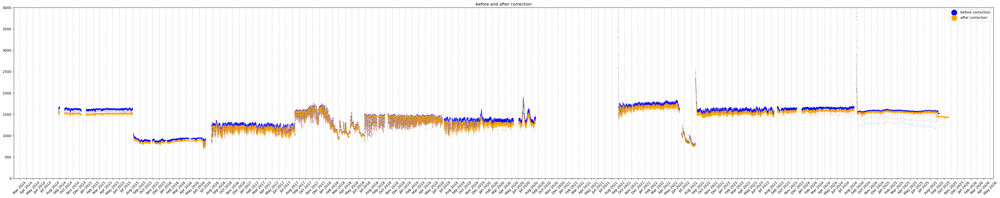

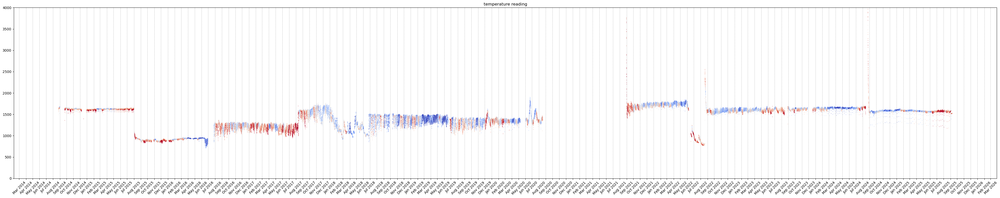

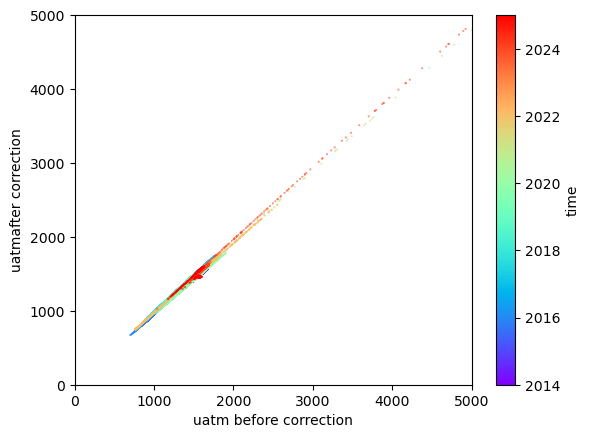

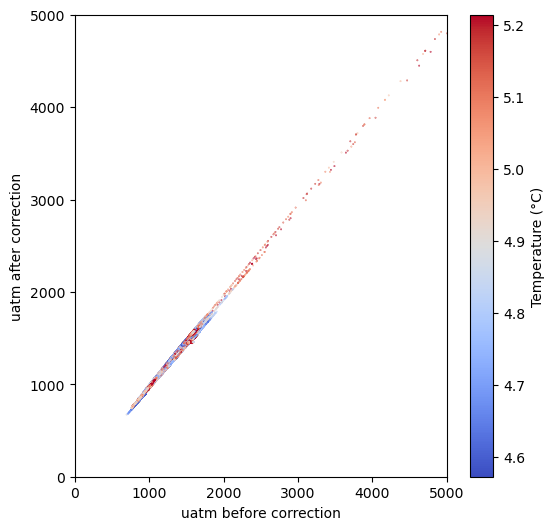

loading CE04OSPS-PC01B-4D-PCO2WA105-streamed-pco2w_a_sami_data_record


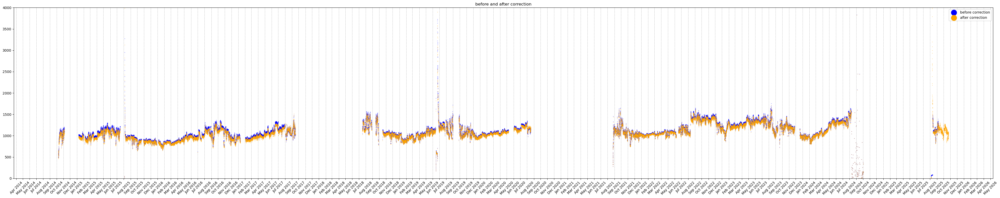

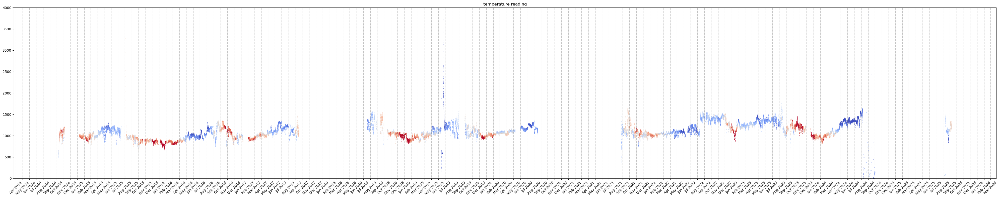

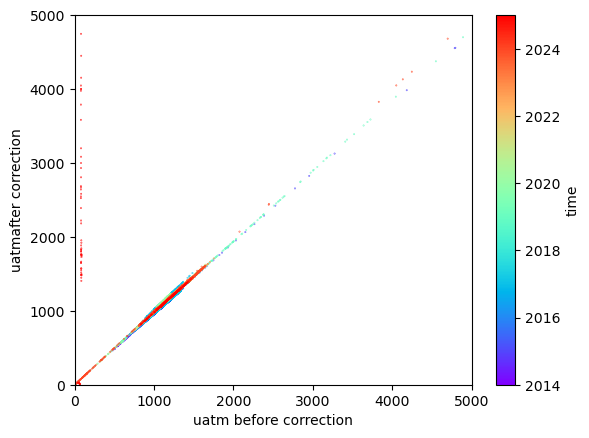

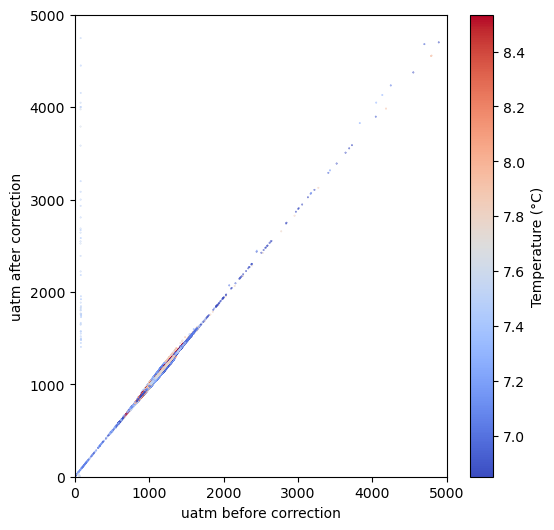

loading CE04OSPS-SF01B-4F-PCO2WA102-streamed-pco2w_a_sami_data_record


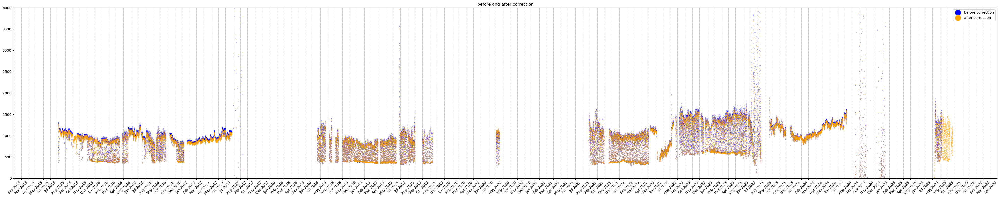

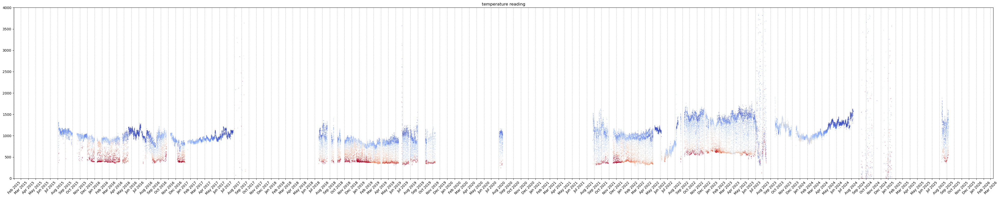

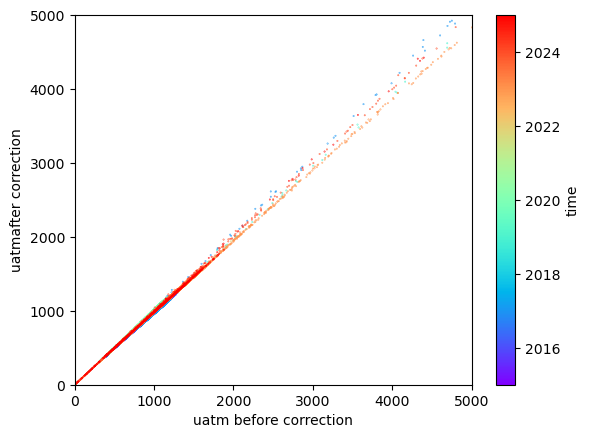

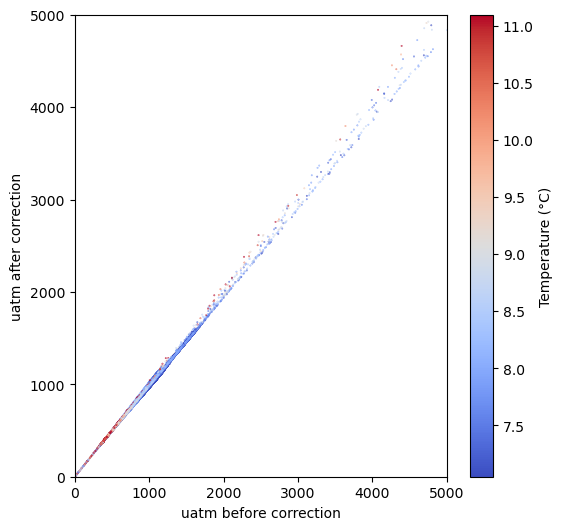

loading RS01SBPS-SF01A-4F-PCO2WA101-streamed-pco2w_a_sami_data_record


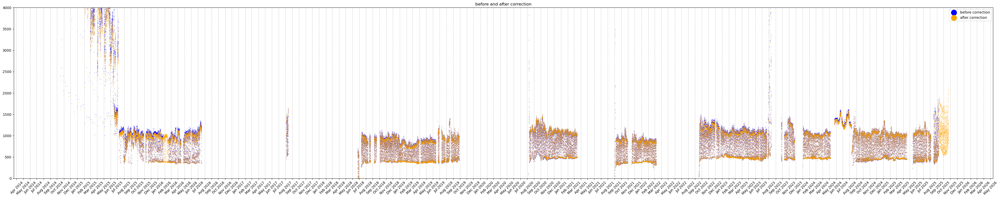

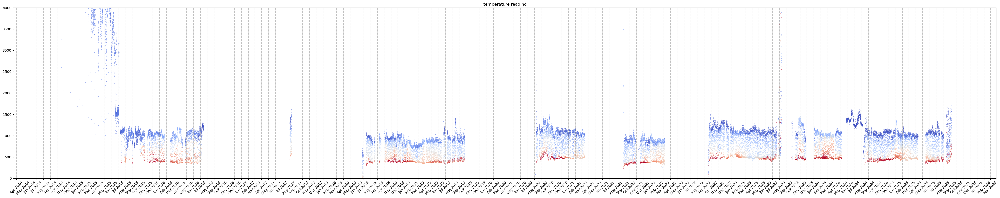

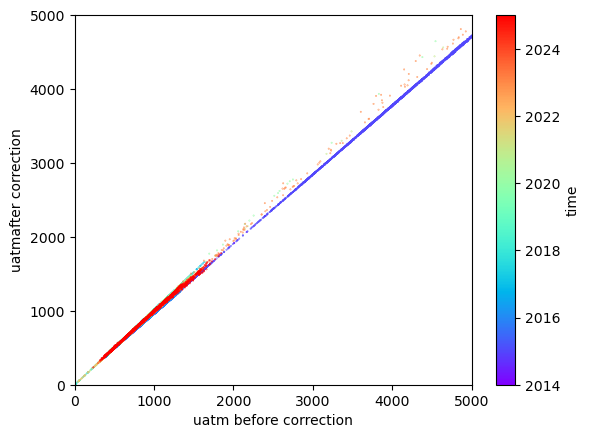

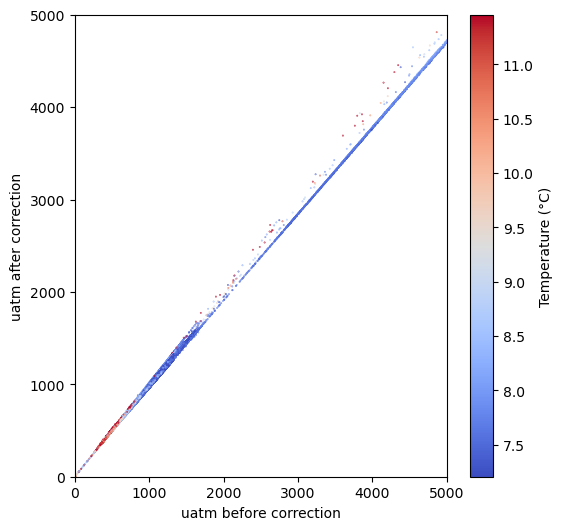

loading RS03AXPS-SF03A-4F-PCO2WA301-streamed-pco2w_a_sami_data_record


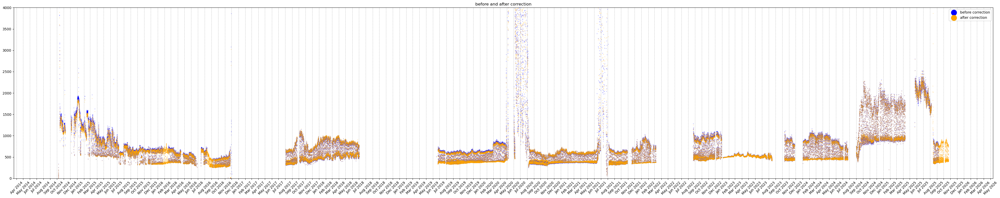

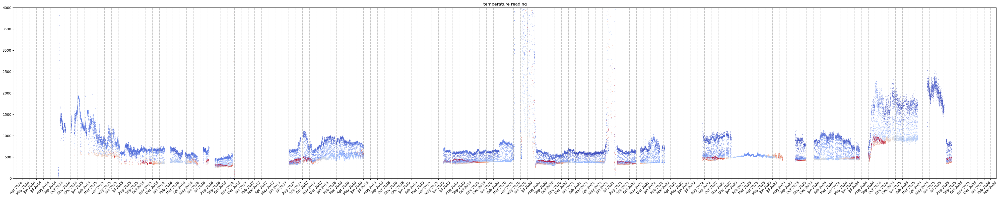

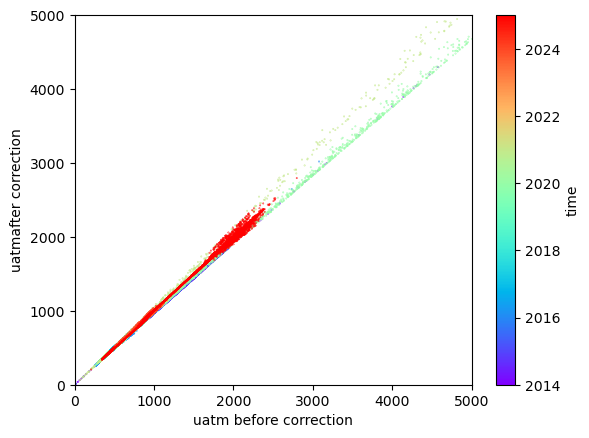

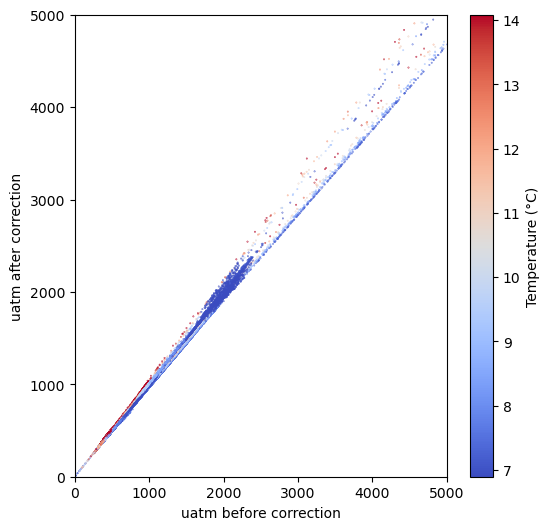

In [7]:
res_dict = {}
for stream in stream_list:
    before, after = stream_summary(stream)
    res_dict[stream] = (before, after)

## Calibration difference in representative science pod profiles

In [8]:
def load_regridding_inputs(refdes, append=True):
    
    now = datetime.now(timezone.utc)
    current_year = now.year
    if append:
        years = current_year
    else:
        years = list(range(START_YEAR, current_year + 1))
    
    site = refdes[:8]
    stream_name = SITES_DICT[refdes]['zarrFile']
    
    logger.info("loading profile indices")
    profile_indices_list = []
    for year in years:
        profile_indices = pd.read_csv(
            f"https://raw.githubusercontent.com/OOI-CabledArray/profileIndices/refs/heads/main/{site}_profiles_{year}.csv"
        )
        profile_indices_list.append(profile_indices)

        all_indices = pd.concat(profile_indices_list, axis=0, ignore_index=True)


    return all_indices

In [9]:
START_YEAR = 2023
SITES_DICT = (
    pd.read_csv("https://raw.githubusercontent.com/OOI-CabledArray/rca-data-tools/refs/heads/main/rca_data_tools/qaqc/params/sitesDictionary.csv")
    .set_index('refDes')
    .T.to_dict('series')
)

VARIABLE_MAP = (
    pd.read_csv("https://raw.githubusercontent.com/OOI-CabledArray/rca-data-tools/refs/heads/main/rca_data_tools/qaqc/params/variableMap.csv")
    .set_index('parameter')
    .T.to_dict('series')
)

In [10]:
indices_301 = load_regridding_inputs('RS03AXPS-SF03A-4F-PCO2WA301', append=False)
indices_101 = load_regridding_inputs('RS01SBPS-SF01A-4F-PCO2WA101', append=False)
indices_102 = load_regridding_inputs('CE04OSPS-SF01B-4F-PCO2WA102', append=False)

2025-10-23 13:12:22.059 | INFO     | __main__:load_regridding_inputs:13 - loading profile indices
2025-10-23 13:12:22.694 | INFO     | __main__:load_regridding_inputs:13 - loading profile indices
2025-10-23 13:12:23.392 | INFO     | __main__:load_regridding_inputs:13 - loading profile indices


In [11]:
indices_301.head()

,profile,start,peak,end
0,16493,2023-08-28 17:44:00,2023-08-28 18:51:00,2023-08-28 19:28:00
1,16494,2023-08-29 01:25:00,2023-08-29 03:41:00,2023-08-29 04:04:00
2,16495,2023-08-29 05:10:00,2023-08-29 06:19:00,2023-08-29 06:54:00
3,16496,2023-08-29 07:41:00,2023-08-29 08:49:00,2023-08-29 10:24:00
4,16497,2023-08-29 11:31:00,2023-08-29 12:37:00,2023-08-29 13:11:00


In [12]:
res_dict["RS01SBPS-SF01A-4F-PCO2WA101-streamed-pco2w_a_sami_data_record"] # before is 0, after is 1 index

(<xarray.Dataset> Size: 2MB
 Dimensions:                       (time: 65665)
 Coordinates:
   * time                          (time) datetime64[ns] 525kB 2014-10-07T01:0...
 Data variables:
     pco2_seawater                 (time) float64 525kB 2.043e+04 ... 1.607e+03
     pco2w_thermistor_temperature  (time) float64 525kB 8.046 7.935 ... 7.537
 Attributes: (12/62)
     AssetManagementRecordLastModified:  2025-09-03T15:19:25.444000
     AssetUniqueID:                      ATAPL-58336-00003
     Conventions:                        CF-1.6
     Description:                        pCO2 Water: PCO2W Series A
     FirmwareVersion:                    Not specified.
     Manufacturer:                       Sunburst Sensors
     ...                                 ...
     stream:                             pco2w_a_sami_data_record
     subsite:                            RS01SBPS
     summary:                            Dataset Generated by Stream Engine fr...
     time_coverage_end:        

In [13]:
def plot_profiles(indices, ds_tuple, tp=1000):
    diff_list = []
    j = 0
    for idx, row in indices.head(tp).iterrows():
    
        before_downcast = ds_tuple[0].sel(time=slice(row['peak'], row['end']))
        after_downcast = ds_tuple[1].sel(time=slice(row['peak'], row['end']))

        
        if len(before_downcast.time) > 0:
            j+=1
            diff = before_downcast / after_downcast
            diff_values = ((1 - diff['pco2_seawater'].values) * 100)
            diff_list.append(diff_values)

            plt.figure(figsize=(8, 8))
            plt.scatter(
                before_downcast['pco2w_thermistor_temperature'],
                before_downcast['pco2_seawater'],
                label='before',
                color='blue',
                )
            plt.scatter(
                after_downcast['pco2w_thermistor_temperature'],
                after_downcast['pco2_seawater'],
                label='after',
                color='orange', 
                )
    
            plt.legend() 
            
    
            plt.ylabel(f"{before_downcast['pco2_seawater'].units}")
            plt.xlabel(f"{before_downcast['pco2w_thermistor_temperature'].units}")
            if j<=20:
                plt.show()
            else:
                plt.close() 

    return diff_list
        

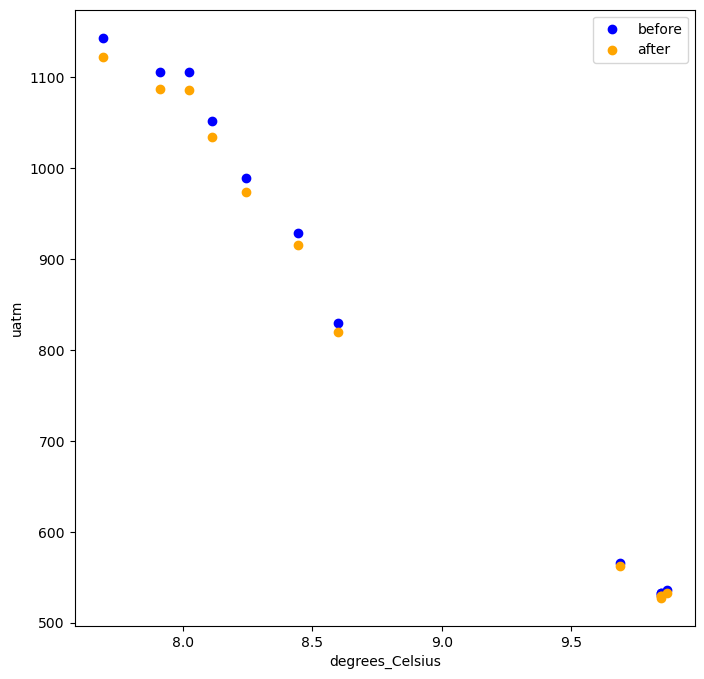

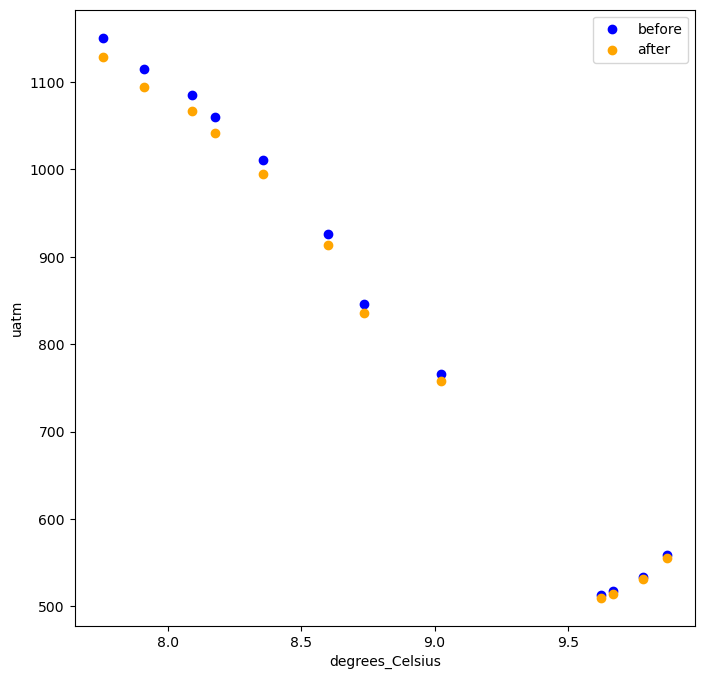

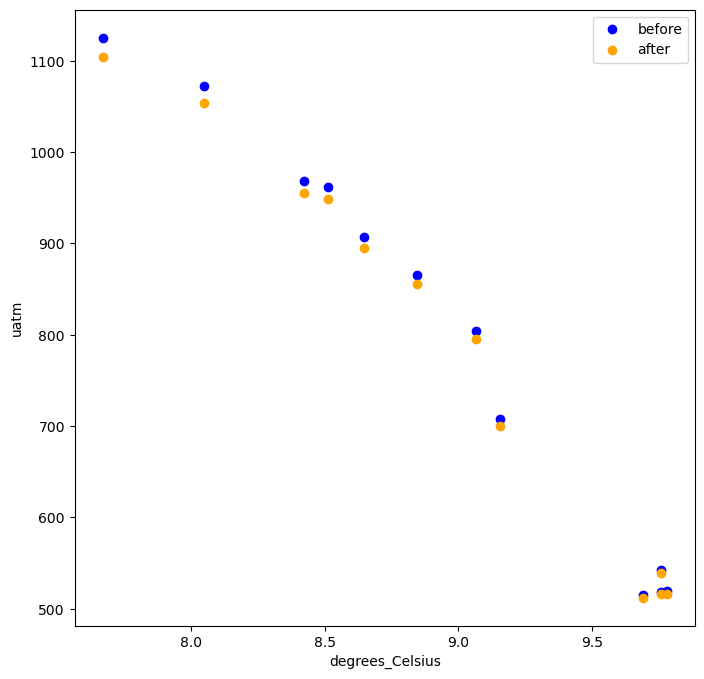

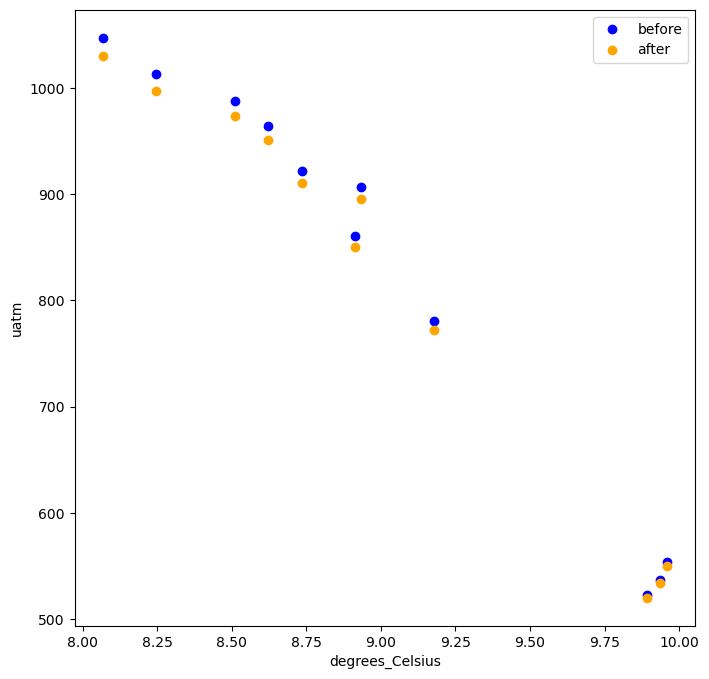

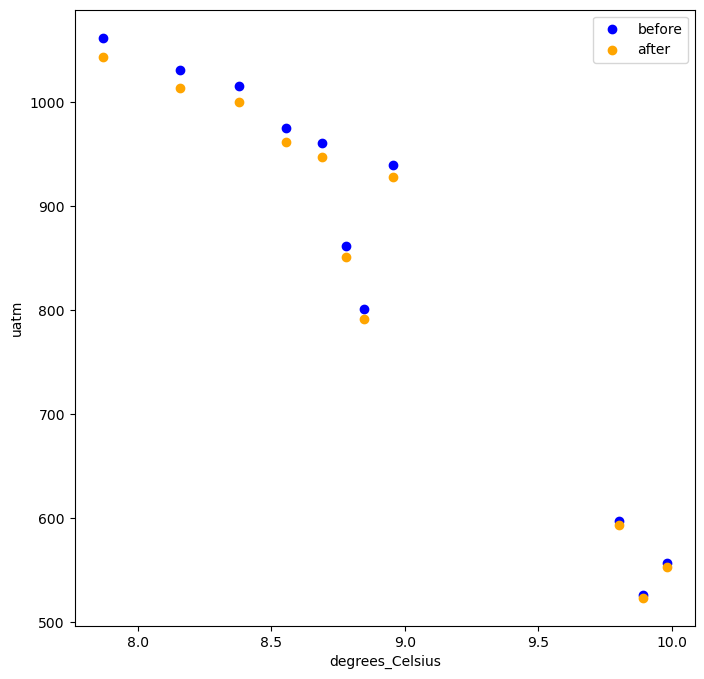

...

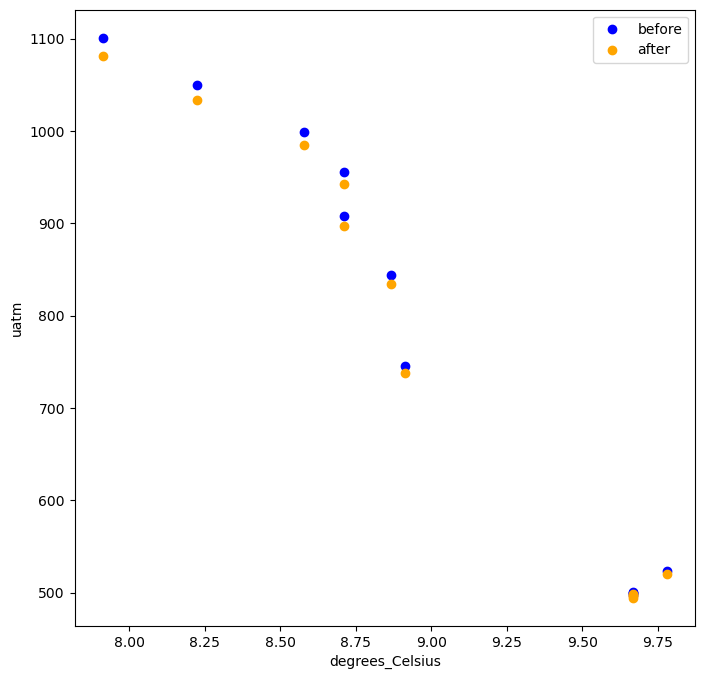

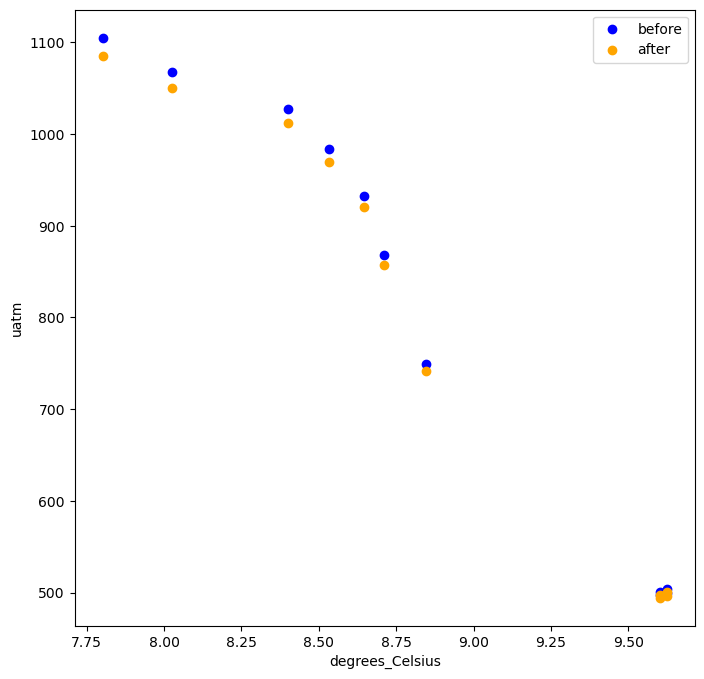

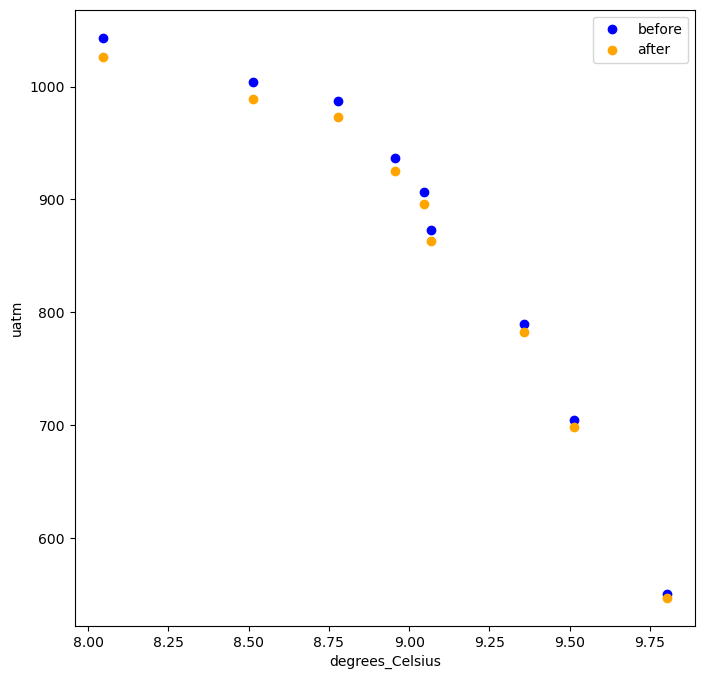

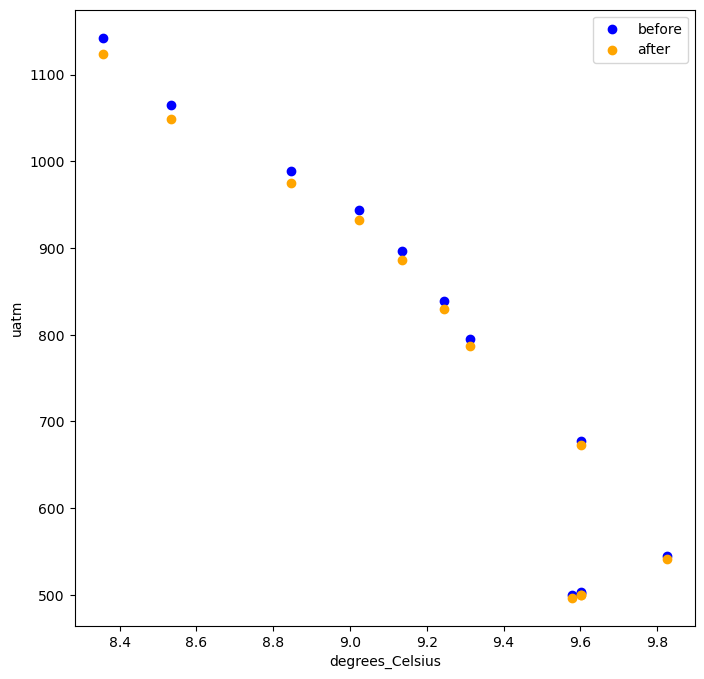

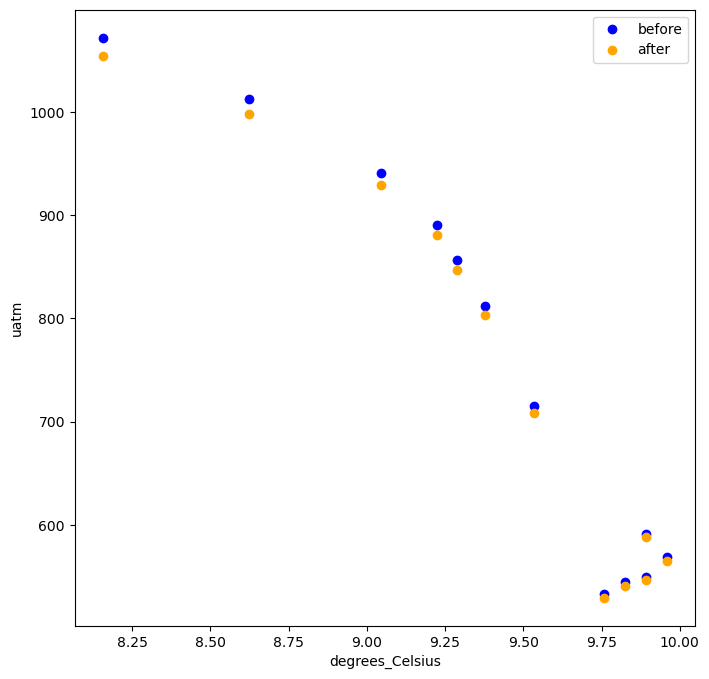

In [14]:
diff_101 = plot_profiles(indices_101, res_dict["RS01SBPS-SF01A-4F-PCO2WA101-streamed-pco2w_a_sami_data_record"])

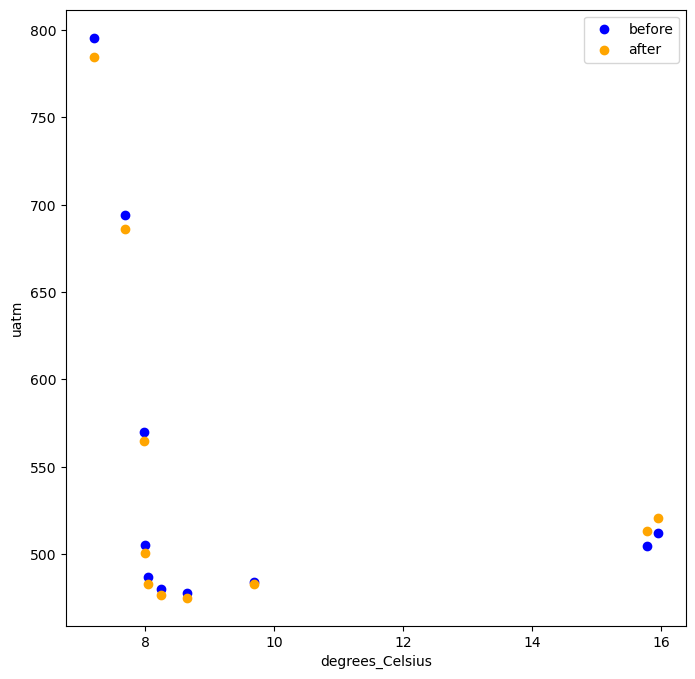

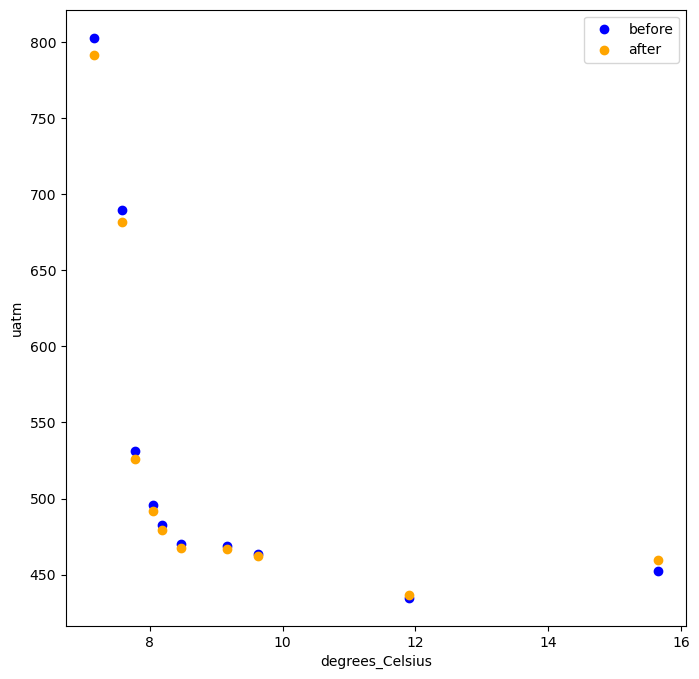

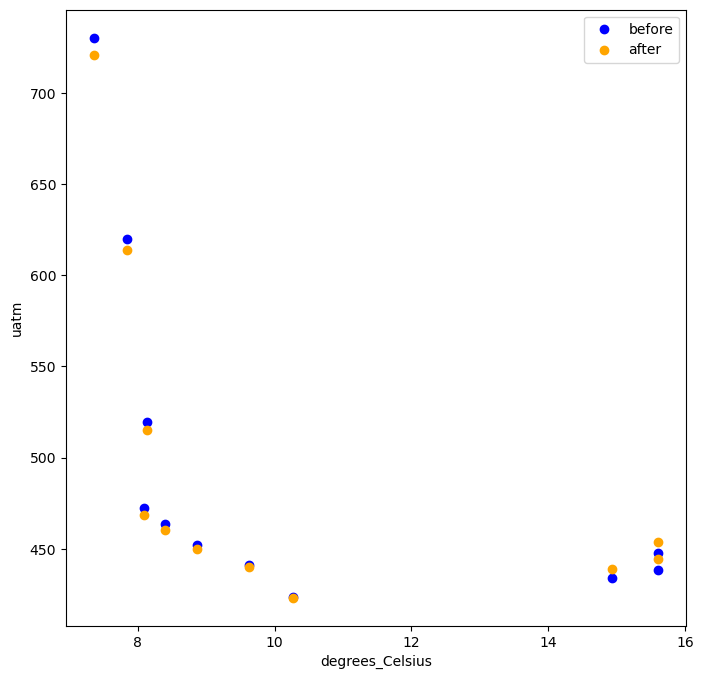

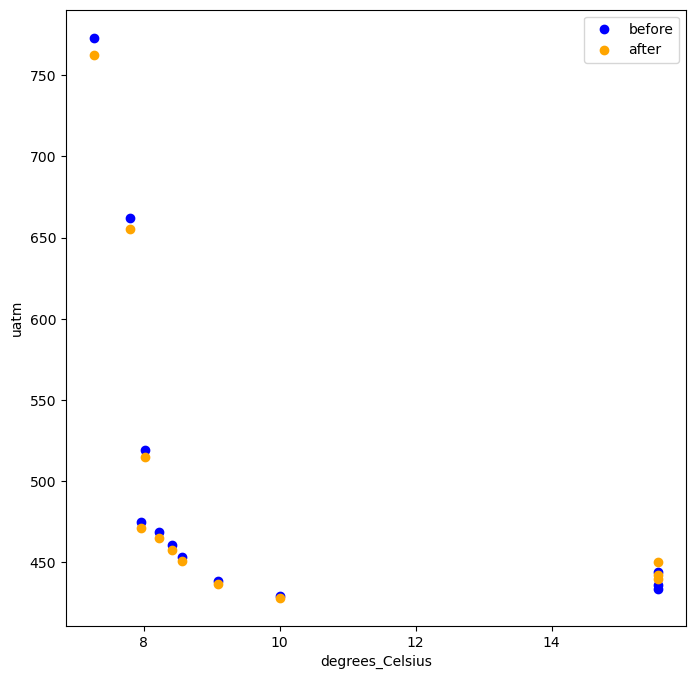

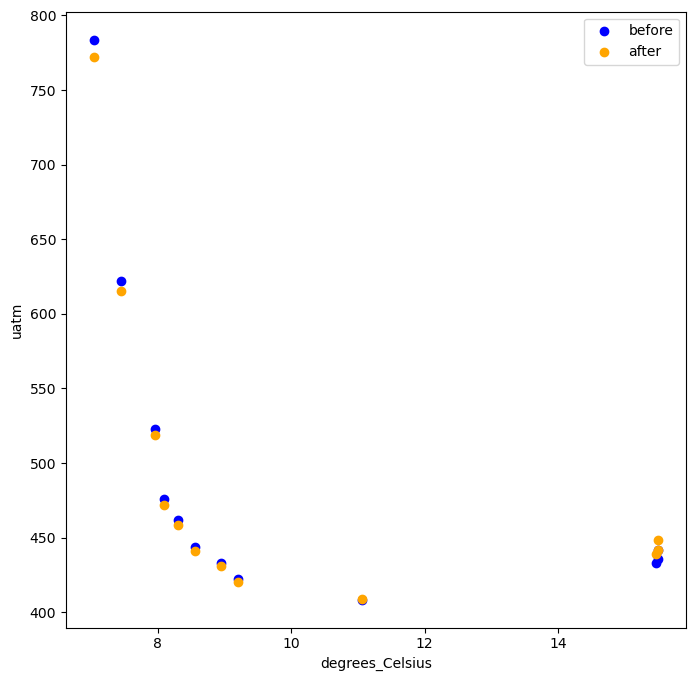

...

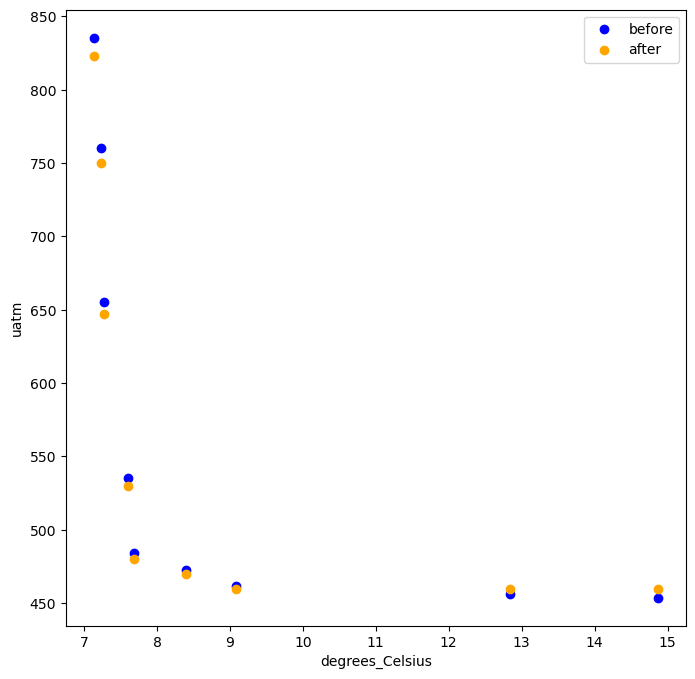

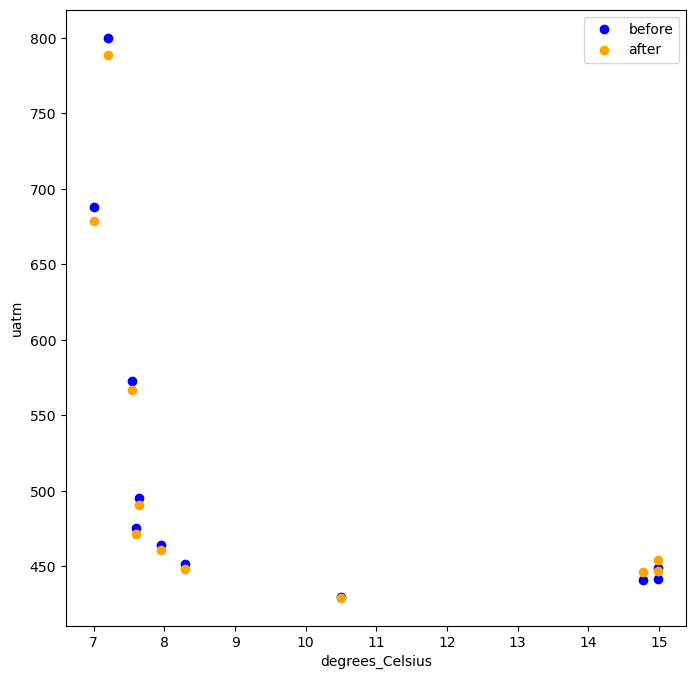

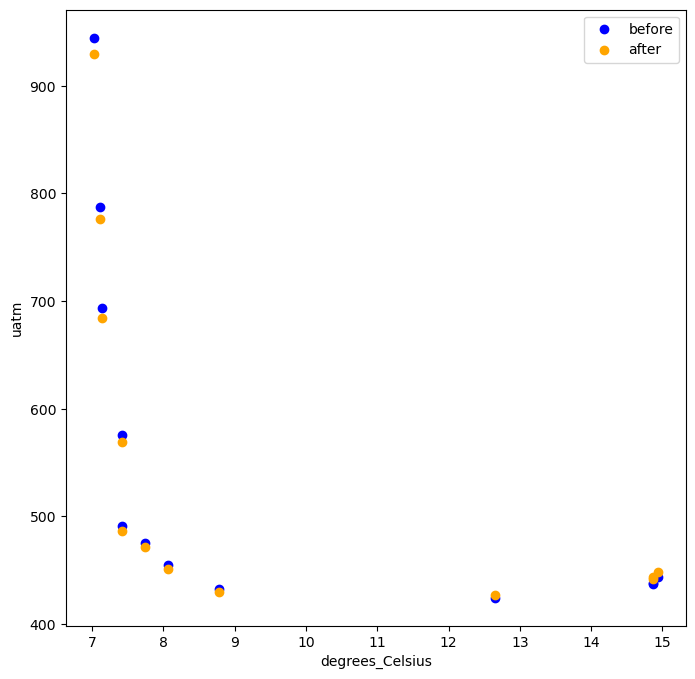

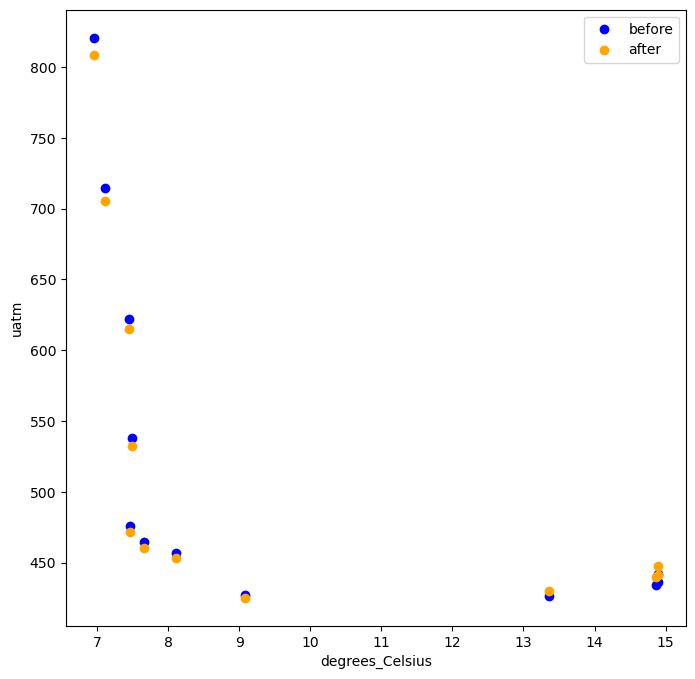

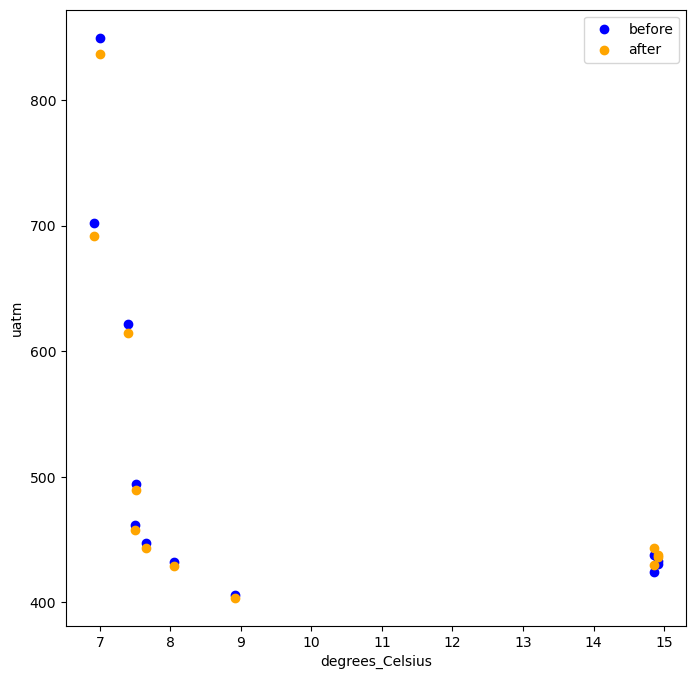

In [15]:
diff_301 = plot_profiles(indices_301, res_dict["RS03AXPS-SF03A-4F-PCO2WA301-streamed-pco2w_a_sami_data_record"])

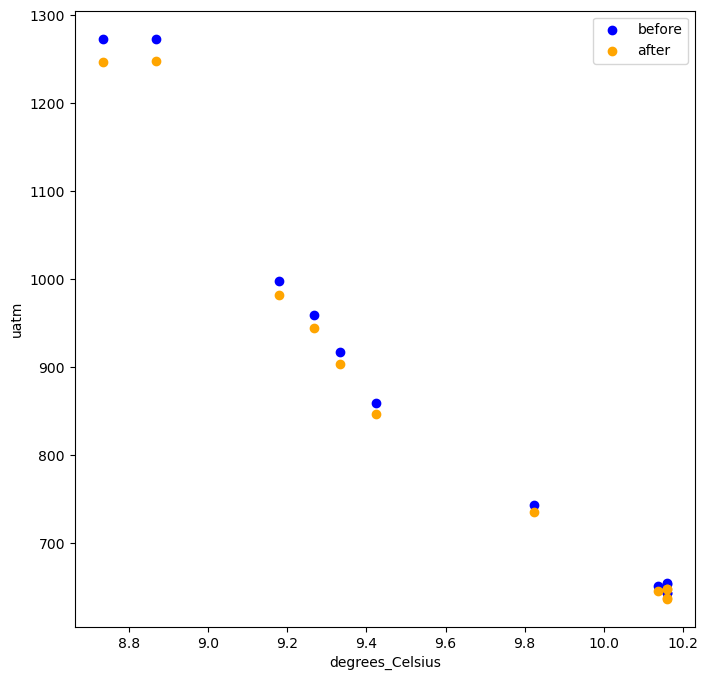

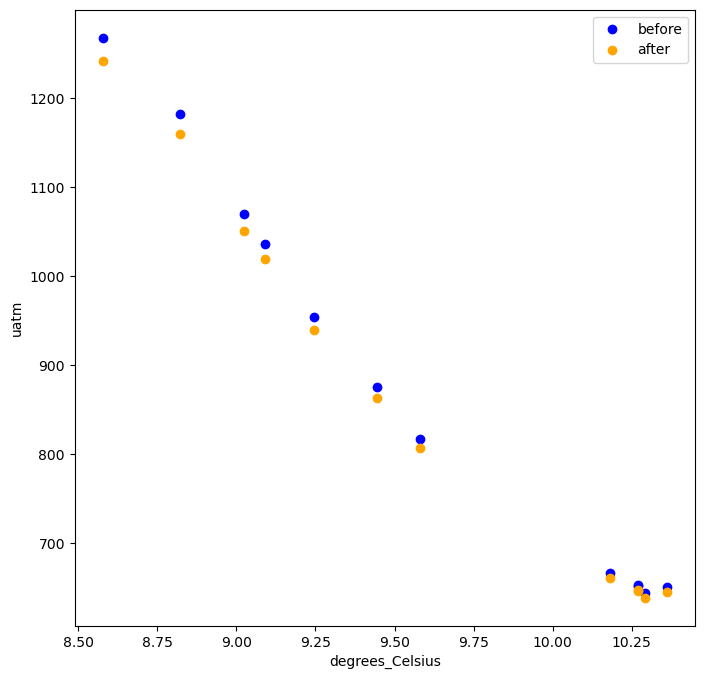

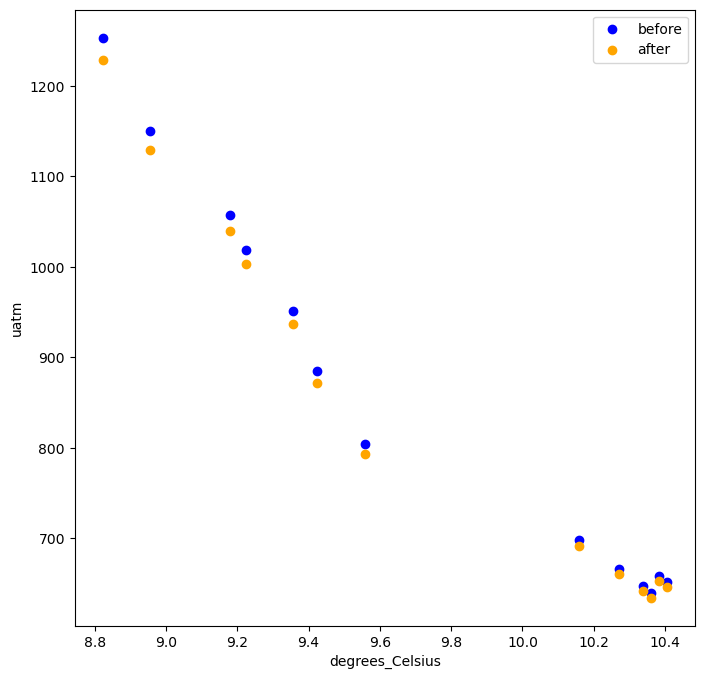

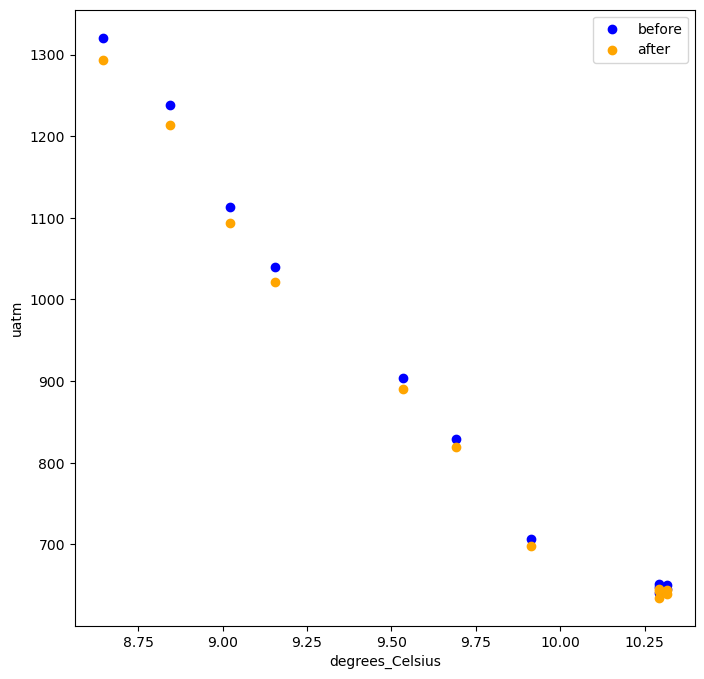

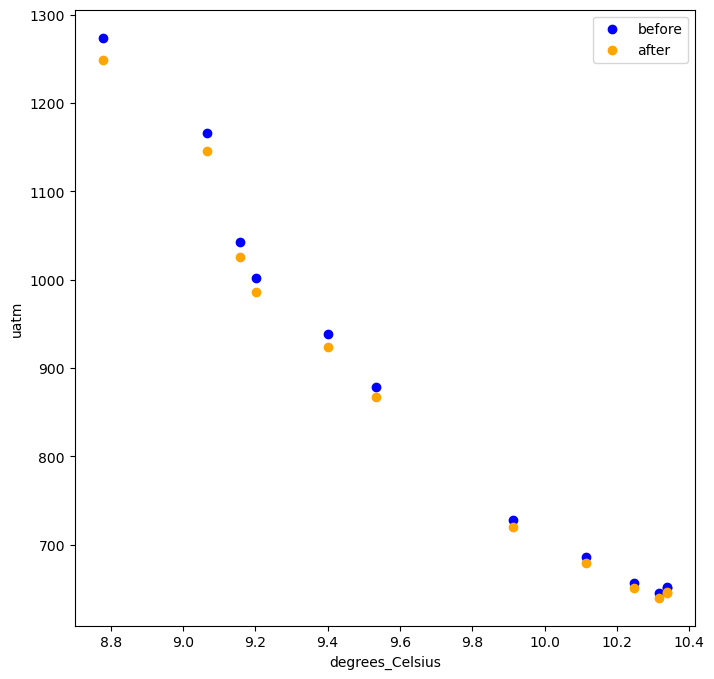

...

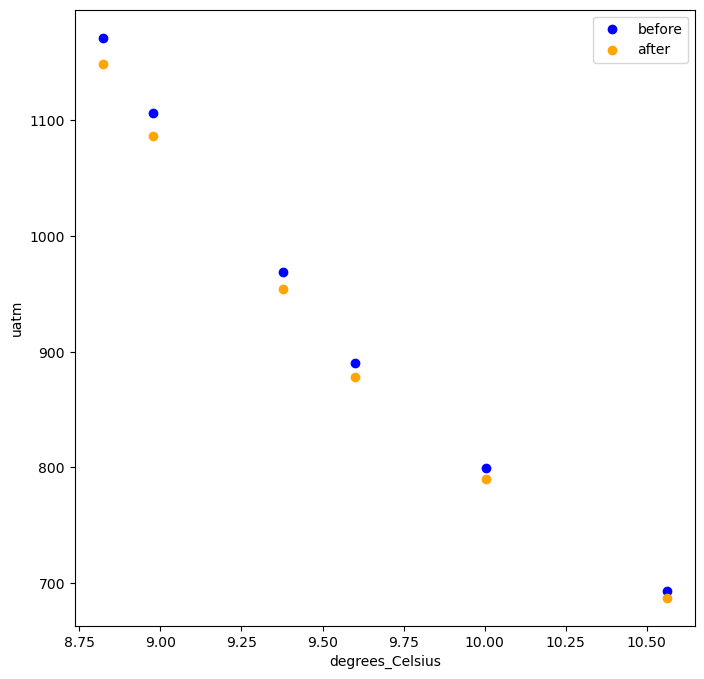

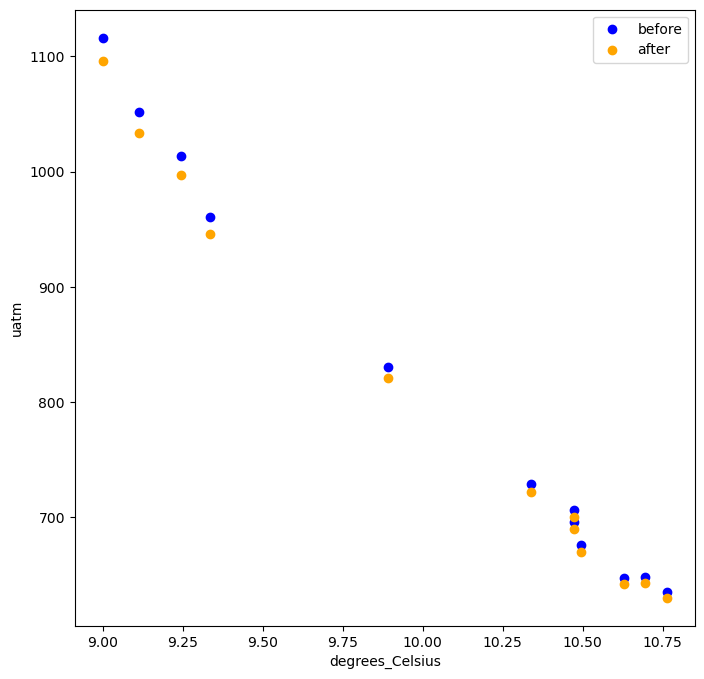

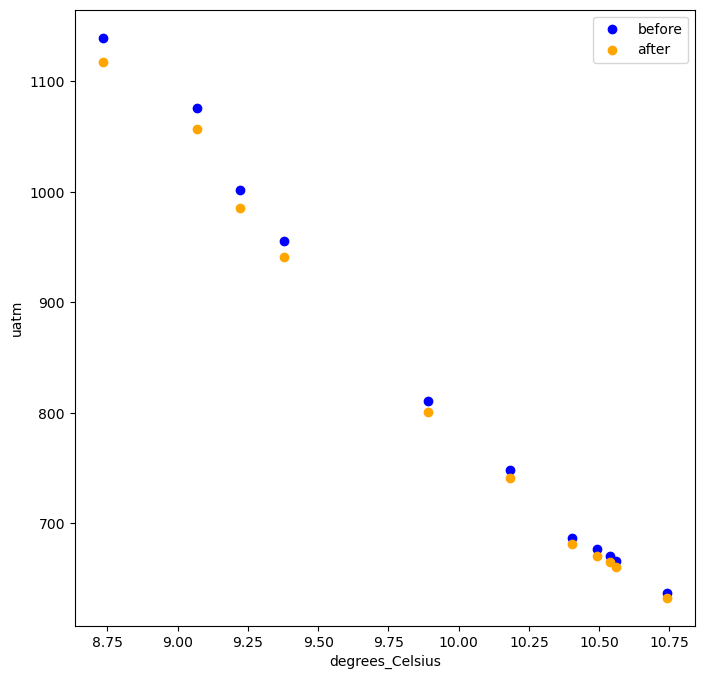

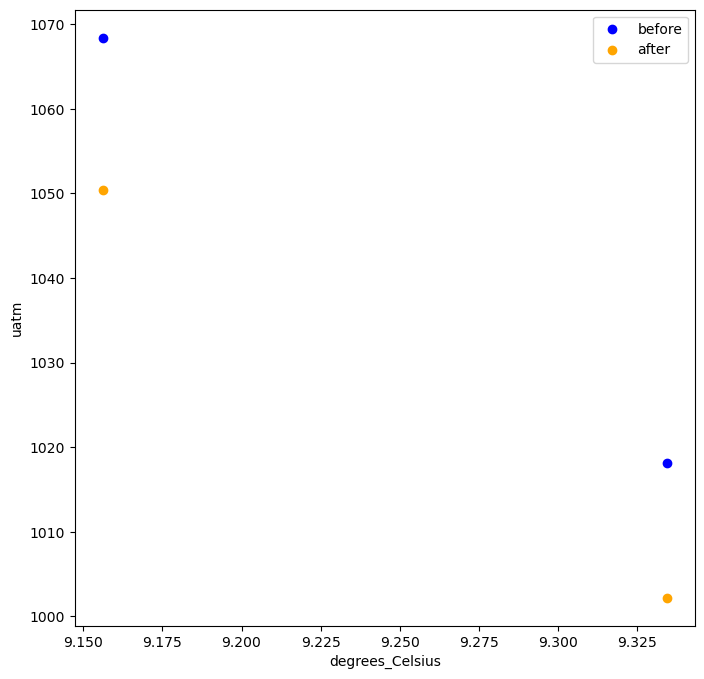

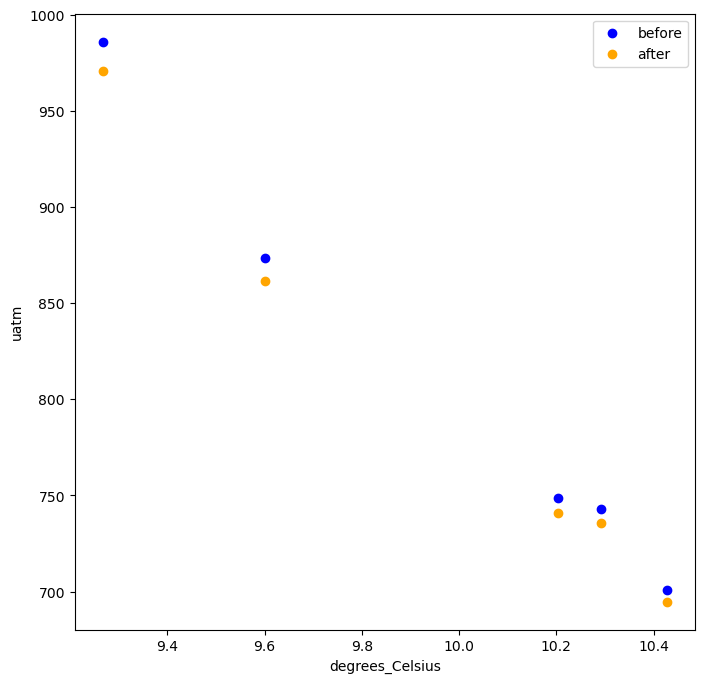

In [16]:
diff_102 = plot_profiles(indices_102, res_dict["CE04OSPS-SF01B-4F-PCO2WA102-streamed-pco2w_a_sami_data_record"])

In [17]:
def summarize_cal_changes(diff, title):
    mean_list = []
    max_list = []
    for array in diff:
        mean = np.mean(np.abs(array))
        max_diff = np.max(np.abs(array))
        mean_list.append(mean)
        max_list.append(max_diff)

    mean_diff = np.mean(mean_list)
    greatest_diff_est = np.mean(max_list)
    print(f"mean abs diff {mean_diff:.2f}")
    print(f"mean of greatest abs diff per profile {greatest_diff_est:.2f}")

    combined = np.concatenate(diff)
    print(f"data points {len(combined)}")

    # Make a histogram
    plt.hist(combined, bins=50)
    plt.title(title)
    plt.xlabel('percent change')
    plt.ylabel('count')
    plt.show()


mean abs diff 0.93
mean of greatest abs diff per profile 1.66
data points 1514


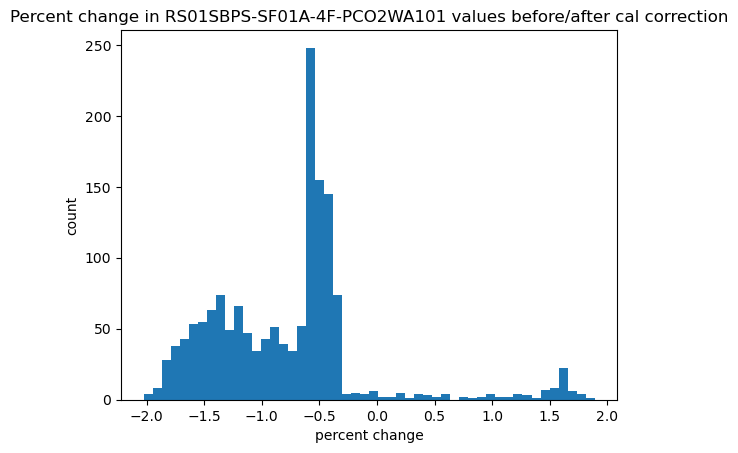

In [18]:
summarize_cal_changes(diff_101, "Percent change in RS01SBPS-SF01A-4F-PCO2WA101 values before/after cal correction")

mean abs diff 0.79
mean of greatest abs diff per profile 1.42
data points 1303


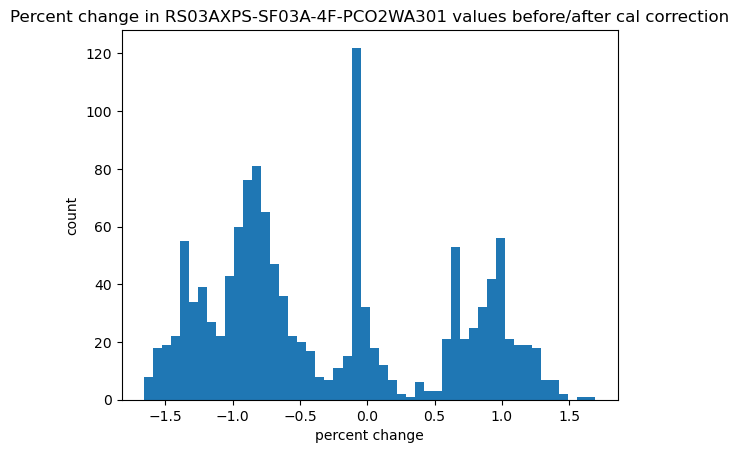

In [19]:
summarize_cal_changes(diff_301, "Percent change in RS03AXPS-SF03A-4F-PCO2WA301 values before/after cal correction")

mean abs diff 1.56
mean of greatest abs diff per profile 2.49
data points 2593


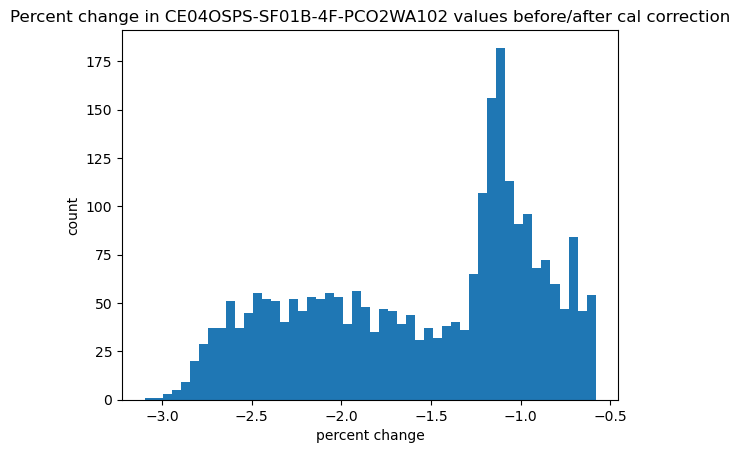

In [20]:
summarize_cal_changes(diff_102, "Percent change in CE04OSPS-SF01B-4F-PCO2WA102 values before/after cal correction")

## Summary
The largest impact is seen at the shelf site CE04OSPS and at relatively lower temperatures. 

| Reference Designator            | Mean Abs Diff (%) | Mean of Greatest Abs Diff per Profile (%) | Data Points Sampled|
| --------------------------- | ------------- | ------------------------------------- | ----------- |
| CE04OSPS-SF01B-4F-PCO2WA102 | 1.56          | 2.49                                  | 2593        |
| RS03AXPS-SF03A-4F-PCO2WA301 | 0.79          | 1.42                                  | 1303        |
| RS01SBPS-SF01A-4F-PCO2WA101 | 0.93          | 1.66                                  | 1514        |